# Mask-RCNN for Instance Segmentation

## Overview
Instance segmentation is a subtype of image segmentation which identifies and delineates each instance of each object within the image at the pixel level. It combines *object detection*, where the goal is to classify individual objects and localize them using a bounding box, and *semantic segmentation*, where the goal is to classify each pixel into the given classes.

![algorithms](assets/algorithms.png)

Developed by Facebook Research, Mask-RCNN - [He et al.,2017](https://arxiv.org/abs/1703.06870) - is an extension of Region-based Convolutional Neural Networks (R-CNN) family of object detection models - [Girshick et al.,2014](https://arxiv.org/abs/1311.2524). R-CNN models comprise a two stage framework - the first stage generates proposals (areas likely to contain an object) based on features extracted by a CNN backbone. The second stage utilises a lightweight neural network to classify features of each proposed region to predict underlying object category and bounding boxes. Mask-RCNN improves precision of object detection by incorporating an additional functional branch supporting assimilation and prediction of object segmentation masks into the model framework. Links to further information charting evolution of R-CNN family of object detection models may be found [here](https://lilianweng.github.io/lil-log/2017/12/31/object-recognition-for-dummies-part-3.html) or [here](https://d2l.ai/chapter_computer-vision/rcnn.html). 


![mask_rcnn](assets/mask-rcnn.png)
![mask_rcnn_examples](assets/mask-rcnn-examples.png)

## Method

This study focussed on evaluation of the Matterport open source implementation of Mask R-CNN algorithm - see: https://github.com/matterport/Mask_RCNN. The GitHub repository provides comprehensive documentation and several example notebooks covering model configuration, training and inference. A nice Medium article authored by Matterport team reviewing their implementation of Mask-RCNN algorithm may be found [here](https://engineering.matterport.com/splash-of-color-instance-segmentation-with-mask-r-cnn-and-tensorflow-7c761e238b46).

The study utilised images extracted from Airbus Ship Detection Kaggle Challenge dataset for training and inference - see: https://www.kaggle.com/c/airbus-ship-detection. A CSV file packaged with the dataset contains records specifying pixel boundary of all image objects in run-length encoded (RLE) format - this vector may be readily transformed into ground-truth bounding box and segmentation mask for training customised Mask-RCNN model. Images are encoded as 24-bit 768x768 pixel JPG files and originally extracted from SPOT satellite imagery at 1.5 meters resolution. Images feature tankers, commercial and fishing ships of various shapes and sizes. 

Inheriting functionality of Matterport Mask-RCNN project requires implementation of specialised Config and Dataset classes. Functionality of ShipDataset and ShipConfig classes is closely aligned with example code published [here](https://github.com/matterport/Mask_RCNN/tree/master/samples/shapes). Additional code is implemented within the scope of the ShipDataset class to convert run length encoded comma separated strings extracted from CSV records into corresponding binary image mask.

In [1]:
# authentication key
import os
os.environ["GOOGLE_APPLICATION_CREDENTIALS"]='C:/Users/Chris.Williams/.gcs/arkham-255409-c59a52d8653f.json'

In [2]:
# define repo name and get root working directory
repo = 'shipab'
root_path = os.getcwd()[ 0 : os.getcwd().find( repo ) + len ( repo )]
root_path

'C:\\Users\\Chris.Williams\\Documents\\GitHub\\shipab'

In [3]:
# add repo source directory to system path
import sys
sys.path.insert(0, os.path.join( root_path, 'src' ) )

In [4]:
from google.cloud import storage
from io import BytesIO

# download pretrained model from google cloud
client = storage.Client()
bucket = client.get_bucket('eo-ald-update')

# construct remote path
filenames = [ 'models/mask-rcnn.zip', 'data/subset-1.zip' ]

# check files exist
for f in filenames:

    pathname = os.path.join( os.getcwd(), f )
    if not os.path.exists( pathname ):
                
        # make sub-directory if required
        if not os.path.exists ( os.path.dirname( pathname ) ):
            os.makedirs( os.path.dirname( pathname ) )

        # download blob
        remote_url = '{}/{}'.format( repo, f )

        blob = storage.blob.Blob( remote_url, bucket)
        with open( pathname, 'w+b' ) as z:
            blob.download_to_file( z )

In [5]:
from zipfile import ZipFile

# extract downloaded zip files 
for f in filenames:
    pathname = os.path.join( os.getcwd(), f )
#    with ZipFile( pathname, 'r') as zipObj:
       # extract contents to current directory
#       zipObj.extractall( os.path.dirname( pathname ) )

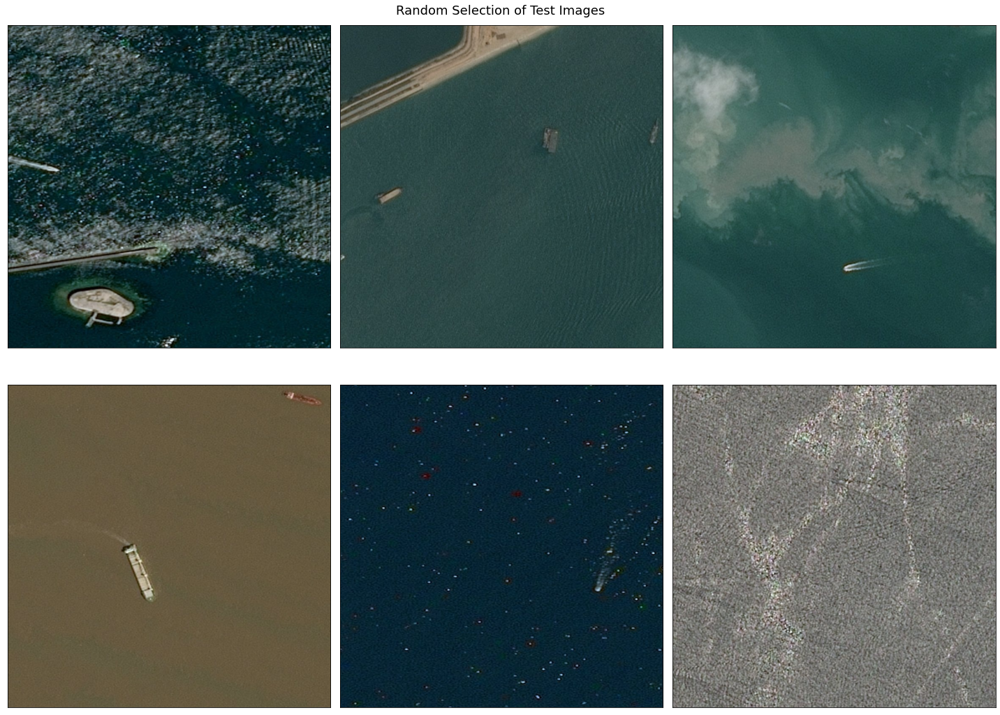

In [6]:
import glob
import random
import matplotlib.pyplot as plt

# get image files
files = glob.glob( os.path.join( os.getcwd(), 'data/subset-1/test/images/*.jpg' ) )

# create plot canvas
nrows = 2; ncols = 3
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 15))
fig.suptitle('Random Selection of Test Images', fontsize=18)

# iterate subplots
for row in range( nrows ):
    for col in range( ncols ):
        
        # load random image
        f = random.choice( files )
        image = plt.imread( f )
        
        # display image + remove axes ticks
        axes[ row ][ col ].imshow( image )
        
        axes[ row ][ col ].get_xaxis().set_ticks([])
        axes[ row ][ col ].get_yaxis().set_ticks([])


# tighten up
fig.tight_layout()        
plt.show()


## Results
A Mask-RCNN model initialised with pretrained weights for COCO MS was trained for 35 epochs against subset of 7000 images extracted from Airbus Ship Detection Kaggle challenge dataset - an additional 1500 images were randomly selected for validation / testing. Diagnostics generated via TensorBoard during training revealed a gradual decrease in cost function suggesting convergence to an optimal solution. Functionality of Matterport Mask-RCNN project was subsequently utilised to evaluate the performance of the trained model - in particular, Intersection over Union (IoU) between actual and predicted bounding boxes and segmented object boundaries.

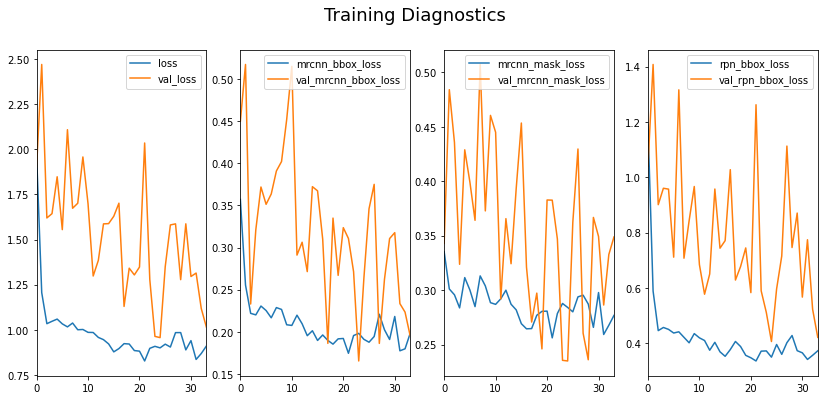

In [7]:
import pandas as pd

# load class-specific diagnostics from csv file
path = 'models/mask-rcnn/'
names=[ 'loss', 'mrcnn_bbox_loss', 'mrcnn_mask_loss', 'rpn_bbox_loss' ]

# create figure
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(14, 6))
fig.suptitle('Training Diagnostics', fontsize=18)

for idx, name in enumerate( names ):
    
    df1 = pd.read_csv( os.path.join( path, '{}.csv'.format(name) ) )
    df2 = pd.read_csv( os.path.join( path, 'val_{}.csv'.format(name) ) )
    
    # plot diagnostics of model 
    df1.plot.line( ax=axes[idx], y=['Value'] )
    df2.plot.line( ax=axes[idx], y=['Value'] )
                      
    axes[idx].legend( [ name, 'val_'+ name ] )
    

In [8]:
from config import ShipConfig
import mrcnn.model as modellib

# initialise configuration
config = ShipConfig()

# initialise model and load weights
model = modellib.MaskRCNN( mode="inference", config=config, model_dir='c:\outpath' )
model.load_weights( 'models/mask-rcnn/mask_rcnn_ship.h5', by_name=True)

c:\program files\python36\lib\site-packages\tensorflow\python\framework\dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
c:\program files\python36\lib\site-packages\tensorflow\python\framework\dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
c:\program files\python36\lib\site-packages\tensorflow\python\framework\dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
c:\program files\python36\lib\site-packages\tensorflow\python\framework\dtypes.py:519: FutureWarning: P








Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Instructions for updating:
box_ind is deprecated, use box_indices instead


Instructions for updating:
Use `tf.cast` instead.


In [9]:
from dataset import ShipDataset

# load validation / test dataset
test_ds = ShipDataset( (768,768) )
test_ds.load_info( 'data/subset-1/test' )
test_ds.prepare()

Processing 1 images
image                    shape: (768, 768, 3)         min:    0.00000  max:  208.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -123.70000  max:  104.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int32
anchors                  shape: (1, 147312, 4)        min:   -0.11800  max:    1.03456  float32
Processing 1 images
image                    shape: (768, 768, 3)         min:   35.00000  max:  142.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min:  -88.70000  max:   38.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int32
anchors                  shape: (1, 147312, 4)        min:   -0.11800  max:    1.03456  float32
Processing 1 images
image                    shape: (768, 768, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -123.70000  max:  151.10000

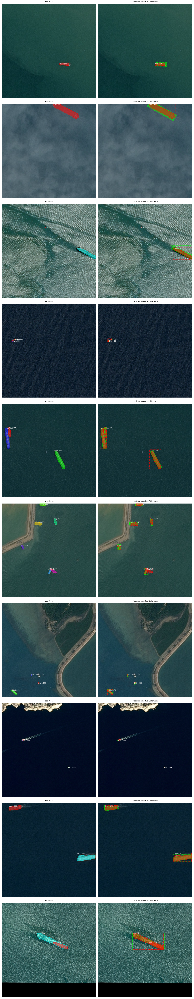

In [11]:
from mrcnn import utils
from mrcnn import visualize

# create plot canvas
nrows = 10; ncols = 2
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 100))

# get random sample of test images
for row in range( nrows ):

    # load random image
    image_id = random.choice( test_ds.image_ids )
    image, image_meta, gt_class_id, gt_bbox, gt_mask = modellib.load_image_gt(  test_ds, 
                                                                                config, 
                                                                                image_id, 
                                                                                use_mini_mask=False )

    # run object detection
    results = model.detect([image], verbose=1)
    r = results[0]

    # display results
    visualize.display_instances(    image, 
                                    r['rois'], 
                                    r['masks'], 
                                    r['class_ids'], 
                                    test_ds.class_names, 
                                    r['scores'], 
                                    title="Predictions",
                                    show_bbox=False,
                                    ax=axes[row][0])
    
    # display actual vs predicted differences
    visualize.display_differences(  image, 
                                    gt_bbox, 
                                    gt_class_id, 
                                    gt_mask,
                                    r['rois'], 
                                    r['class_ids'], 
                                    r['scores'], 
                                    r['masks'], 
                                    test_ds.class_names, 
                                    title="Predicted vs Actual Difference",
                                    ax=axes[row][1])

# tighten up
fig.tight_layout()        
plt.show()


## Addendum

Left hand images show locations of predicted ships - right hand images visualise differences between actual (green) and predicted (red) bounding boxes annotated with sigmoid-based confidence and IoU scores. 